Importing the modules

# Welcome to the notebook 🙂

### Task 1 - Importing the Dataset

In [26]:
import numpy as np
import pandas as pd

# Importing neural network modules
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
# Importing some machine learning modules
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Import data visualization modules
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

print("Modules are imported!")

Modules are imported!


In [27]:
# import dataset
df=pd.read_csv('Creditcard_dataset.csv');
df.head()  # 0 means transaction is Authentic and 1 means transaction is Fraudulent

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,10,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,10,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,11,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Check the data shape

In [28]:
df.shape

(50492, 31)

Let's see how many genuine and limited fraudulent records we have

In [29]:
df['Class'].value_counts() # as we can see here the dataset is highly imbalanced

0    50000
1      492
Name: Class, dtype: int64

### Task 2 - Data Preprocessing and Exploration

*   Removing all the rows with `Nan` values
*   Removing `Time` column
*   Feature Scaling `Amount` column
*   Split the data into features and labels
*   Data Exploration


Removing the rows `Nan` values in the dataset

In [30]:
df.isna().sum() # so there is no any NAN value in the dataset

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [31]:
df.isna().sum().sum() # so there is no any NAN value in the dataset

0

Removing Time column

In [32]:
# drop column named as Time because it only represents the number of transactions 
#till now which is not helpful for our consideration
df.drop(columns=['Time'],inplace=True)
df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Feature Scaling of Amount column

In [33]:
# as we can see Amoount column is not scaled so lets scale it
sc=StandardScaler()
df['Amount']=sc.fit_transform(df[['Amount']])

Let's split the genuine and fraud records into separate dataframes

In [34]:
df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


Split the data into features and labels

In [35]:
df_fraud=df[df.Class==1]
df_nofraud=df[df.Class==0]

In [37]:
X=df.drop(columns=['Class'])
y=df.Class

Data Exploration
  - Apply PCA to reduce the dimensionality of features `X` into two dimensions
  - Use a scatter plot to visualize our data

In [38]:
pca=PCA(2) # all featurs of X to 2 featurs
transformed_data=pca.fit_transform(X)
df=pd.DataFrame(transformed_data)
df.head()

,0,1
0,-0.447840,1.197483
1,-0.582396,0.258270
2,-0.939388,-0.728377
3,-0.630767,-0.499125
4,-0.536287,-1.055365


In [39]:
df['label']=y # add label column to data

In [40]:
df.sample(5)

,0,1,label
10882,-0.359826,2.311400,0
16950,1.786310,0.683204,0
39491,-0.592314,0.187019,0
28300,-1.155434,-1.385839,0
8985,-0.876066,-0.780475,0


Let's Use a scatter plot to visualize our data

In [41]:
px.scatter(df,x=0,y=1,color=df.label.astype(str))

### Task 3 - Building the Generator Model

Write a method to create the Generator model architecture

In [42]:
def build_generator():
    model=Sequential()
    
    model.add(Dense(32,activation='relu',input_dim=29,kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    
    model.add(Dense(64,activation='relu'))
    model.add(BatchNormalization())

    model.add(Dense(128,activation='relu'))
    model.add(BatchNormalization())
    
    model.add(Dense(29,activation='linear')) # 29 because we have 29 independent features
    model.summary()
    
    return model




In [43]:
build_generator() # see structure of Model we made

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_20 (Dense)            (None, 32)                960       
                                                                 
 batch_normalization_8 (Batc  (None, 32)               128       
 hNormalization)                                                 
                                                                 
 dense_21 (Dense)            (None, 64)                2112      
                                                                 
 batch_normalization_9 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 dense_22 (Dense)            (None, 128)               8320      
                                                                 
 batch_normalization_10 (Bat  (None, 128)             

### Task 4 - Building the Discriminator Model

Write a method to create the Discriminator model architecture

In [44]:
def build_descriminator():
    model=Sequential()

    model.add(Dense(128,activation='relu',input_dim=29,kernel_initializer='he_uniform'))
    model.add(BatchNormalization())
    
    model.add(Dense(64,activation='relu'))

    model.add(Dense(32,activation='relu'))
    
    model.add(Dense(32,activation='relu'))
    
    model.add(Dense(16,activation='relu'))
    
    model.add(Dense(1,activation='sigmoid'))

    model.compile(optimizer='adam',loss='binary_crossentropy')
    model.summary()
    
    return model




In [ ]:
build_descriminator()

### Task 5 - Combine Generator and Discriminator models to Build The GAN

In [45]:
def build_gan(generator,discriminator):
   discriminator.trainable=False
   gan_input=Input(shape=(generator.input_shape[1],))
   x =generator(gan_input)

   gan_output=discriminator(x)
   gan=Model(gan_input,gan_output)
   gan.summary()
   return gan

Let's create a method that generates synthetic data using the Generator

In [46]:
def generate_synthetic_data(generator,number):
    noise=np.random.normal(0,1,(number,generator.input_shape[1]))
    fake_data=generator.predict(noise)
    return fake_data

### Task 6 - Train and evaluate our GAN
*    Defining some variables
*    Creating our GAN
*    Training the GAN
*    Monitor the GAN performance using PCA




In [47]:
def monitor_generator(generator):
    # Initialize a PCA (Principal Component Analysis) object with 2 components
    pca = PCA(n_components=2)

    # Drop the 'Class' column from the fraud dataset to get real data
    real_fraud_data = df_fraud.drop("Class", axis=1)

    # Transform the real fraud data using PCA
    transformed_data_real = pca.fit_transform(real_fraud_data.values)

    # Create a DataFrame for the transformed real data and add a 'label' column with the value 'real'
    df_real = pd.DataFrame(transformed_data_real)
    df_real['label'] = "real"

    # Generate synthetic fraud data using the provided generator and specify the number of samples (492 in this case)
    synthetic_fraud_data = generate_synthetic_data(generator, 492)

    # Transform the synthetic fraud data using PCA
    transformed_data_fake = pca.fit_transform(synthetic_fraud_data)

    # Create a DataFrame for the transformed fake data and add a 'label' column with the value 'fake'
    df_fake = pd.DataFrame(transformed_data_fake)
    df_fake['label'] = "fake"

    # Concatenate the real and fake data DataFrames
    df_combined = pd.concat([df_real, df_fake])

    # Create a scatterplot to visualize the data points, using the first and second PCA components as x and y, respectively,
    # and color points based on the 'label' column, with a size of 10
    plt.figure()
    sns.scatterplot(data=df_combined, x=0, y=1, hue='label', s=10)
    plt.show()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 32)                960       
                                                                 
 batch_normalization_11 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_25 (Dense)            (None, 64)                2112      
                                                                 
 batch_normalization_12 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_26 (Dense)            (None, 128)               8320      
                                                                 
 batch_normalization_13 (Bat  (None, 128)             

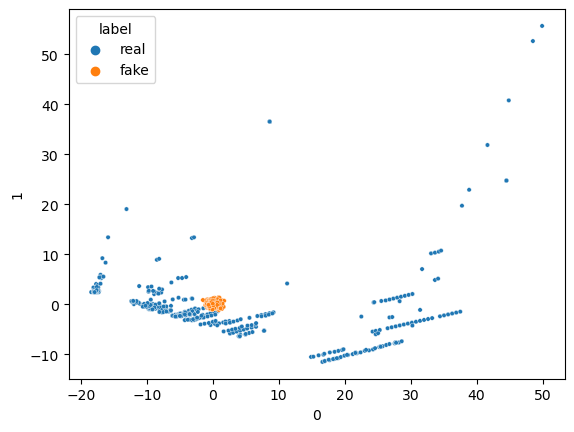

16/16 [==============================] - 0s 6ms/step


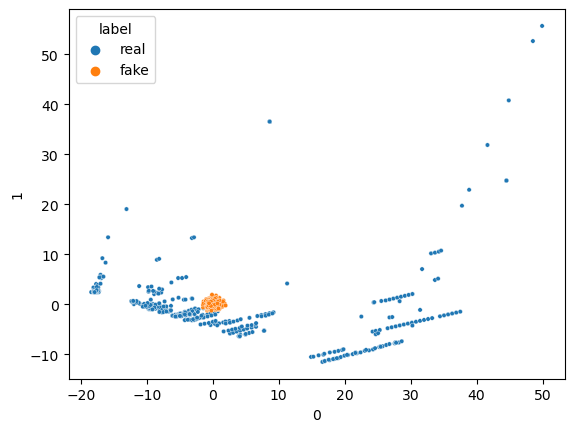

16/16 [==============================] - 0s 1ms/step


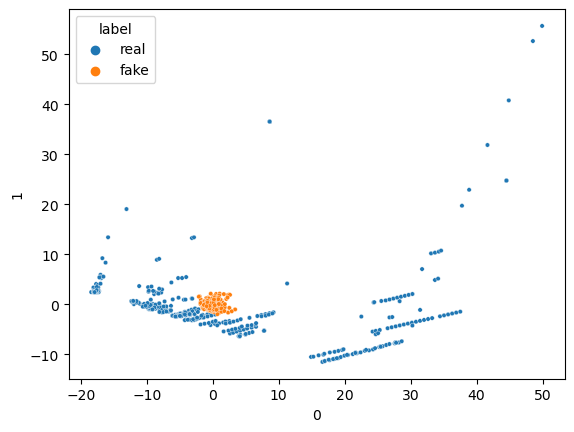

16/16 [==============================] - 0s 1ms/step


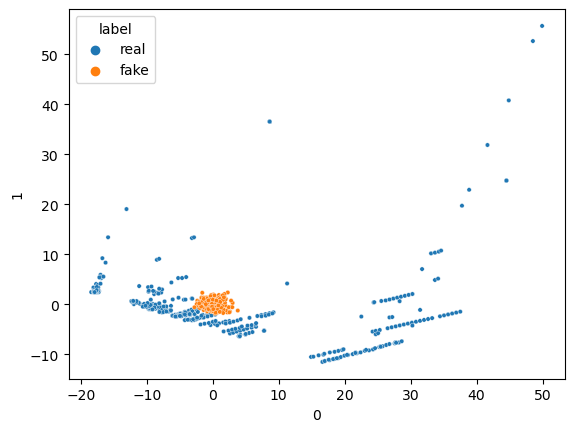

16/16 [==============================] - 0s 5ms/step


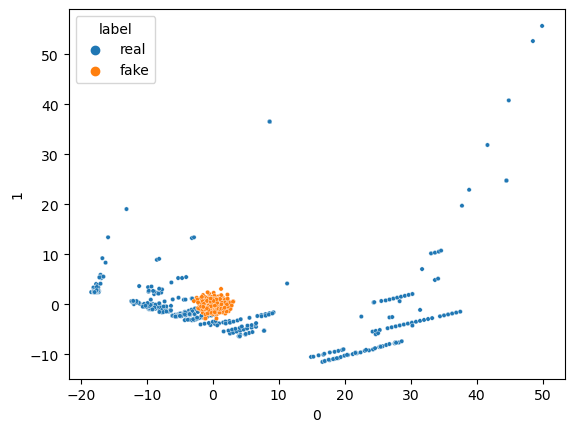

16/16 [==============================] - 0s 1ms/step


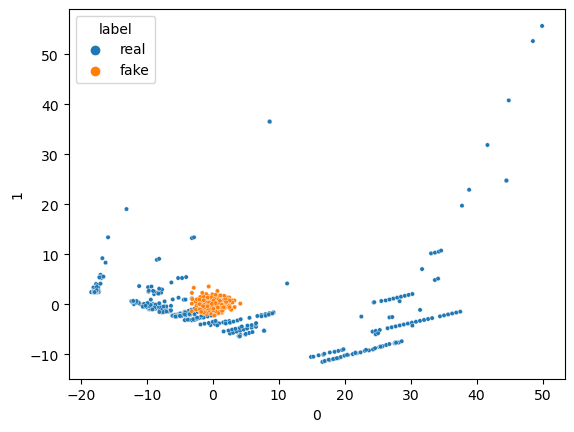

16/16 [==============================] - 0s 1ms/step


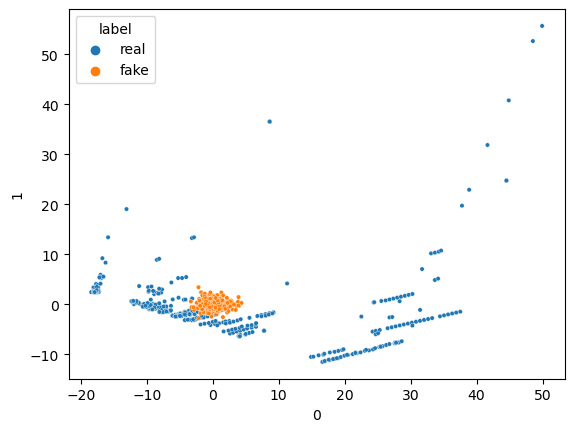

16/16 [==============================] - 0s 1ms/step


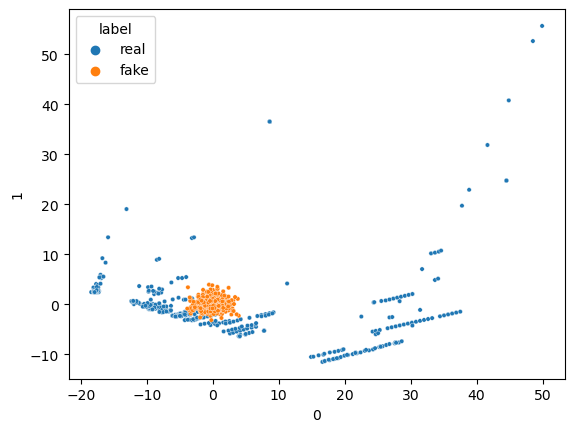

16/16 [==============================] - 0s 6ms/step


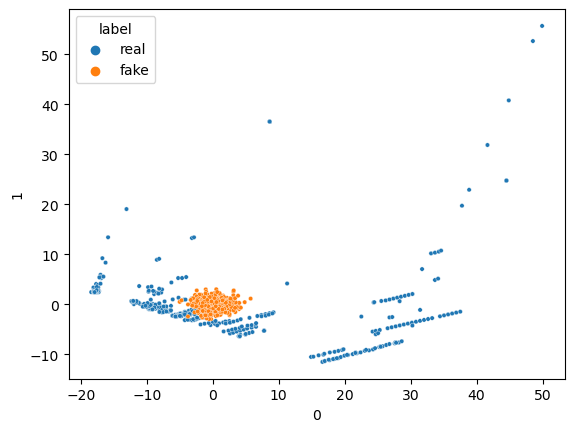

16/16 [==============================] - 0s 924us/step


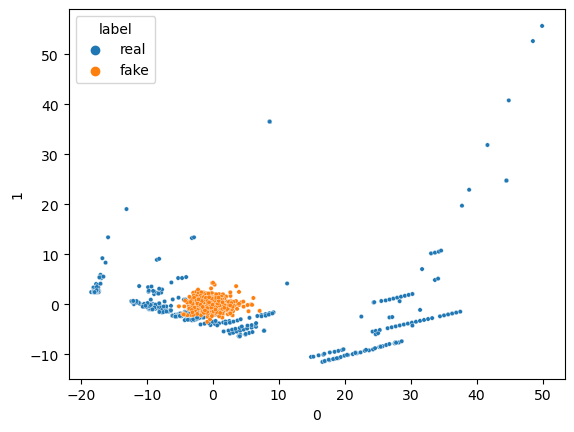

16/16 [==============================] - 0s 923us/step


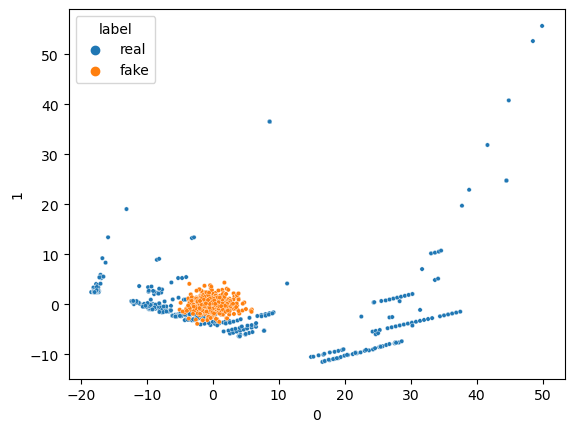

16/16 [==============================] - 0s 883us/step


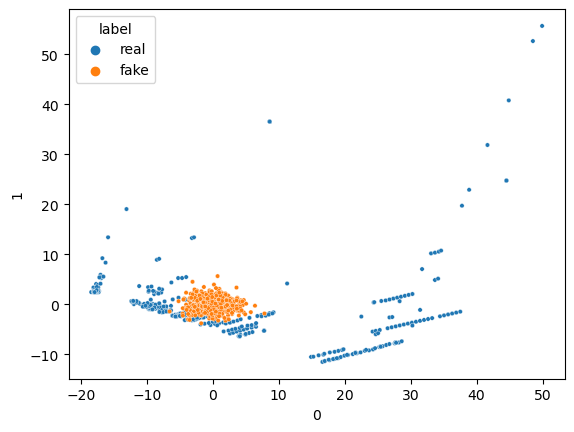

16/16 [==============================] - 0s 6ms/step


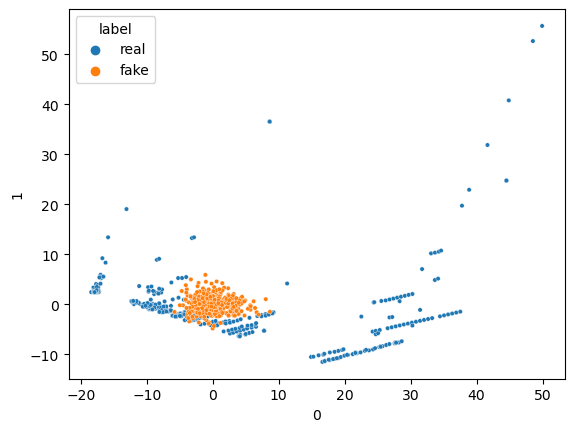

16/16 [==============================] - 0s 859us/step


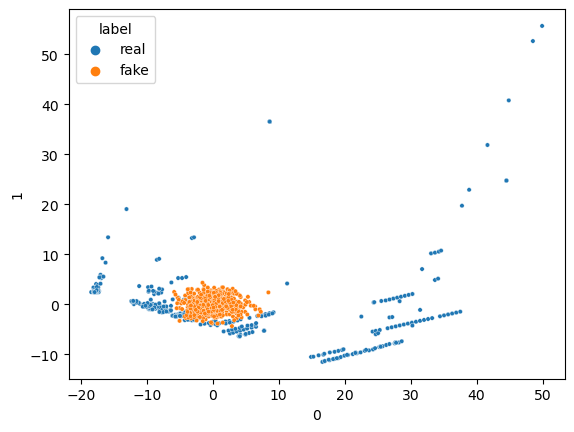

16/16 [==============================] - 0s 1ms/step


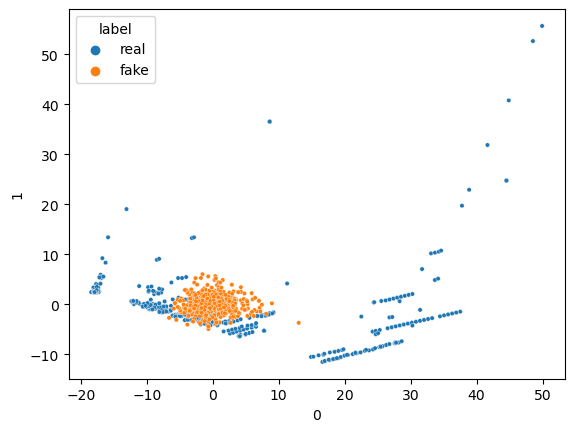

16/16 [==============================] - 0s 987us/step


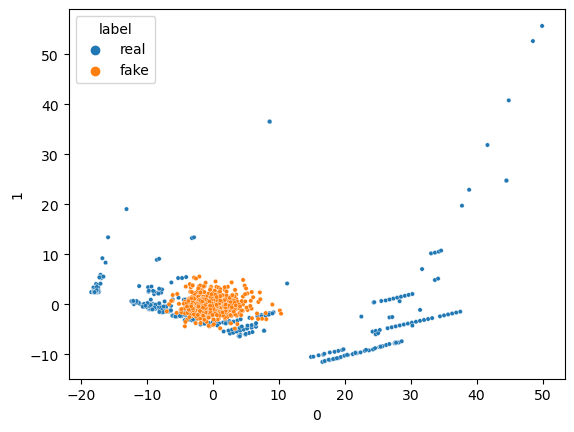

16/16 [==============================] - 0s 931us/step


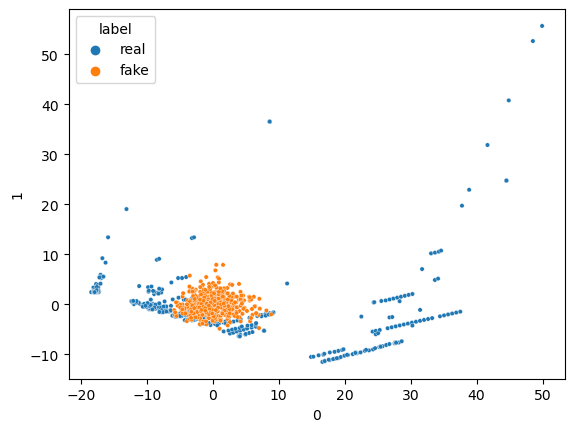

16/16 [==============================] - 0s 866us/step


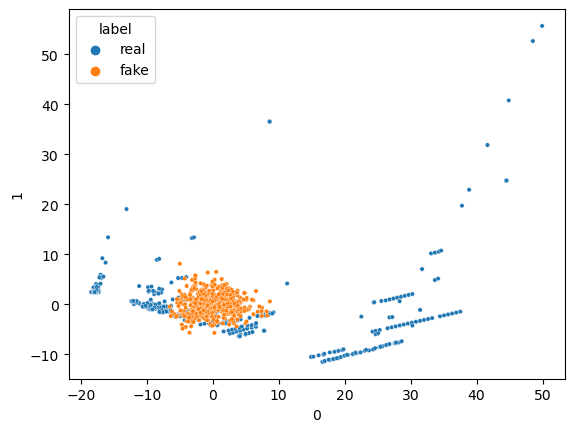

16/16 [==============================] - 0s 1ms/step


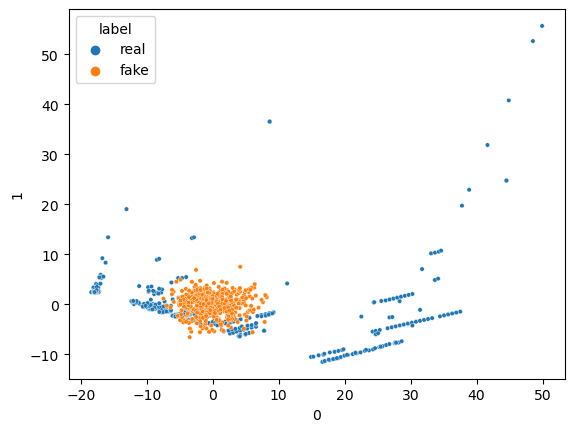

16/16 [==============================] - 0s 1ms/step


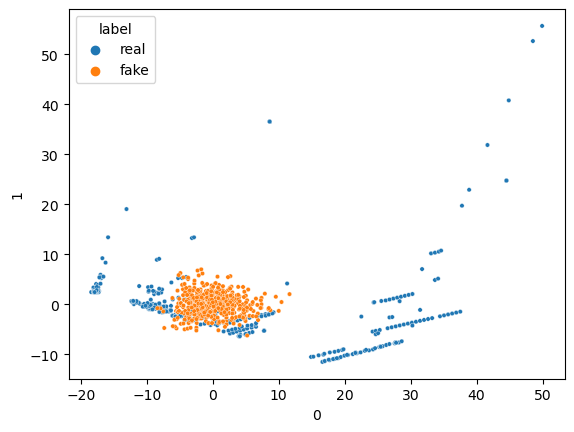

16/16 [==============================] - 0s 982us/step


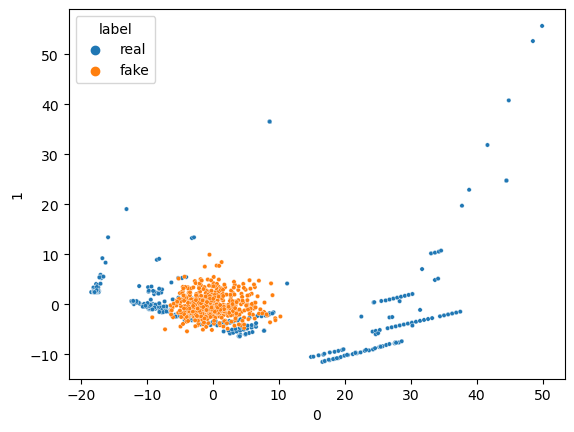

16/16 [==============================] - 0s 914us/step


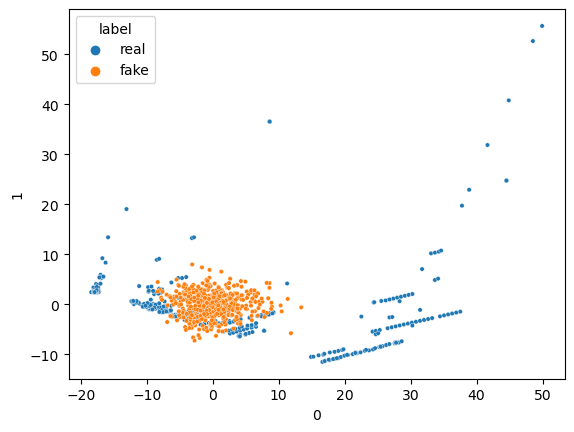

16/16 [==============================] - 0s 913us/step


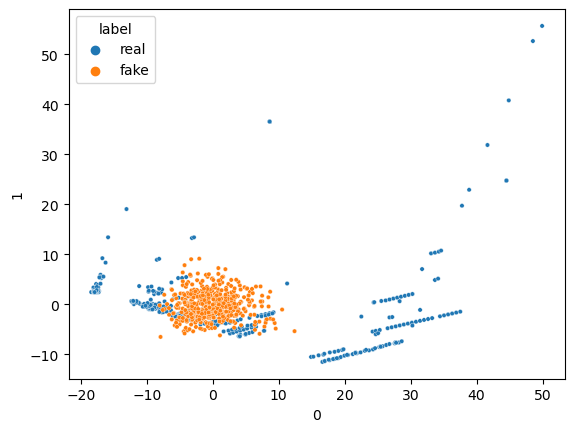

16/16 [==============================] - 0s 6ms/step


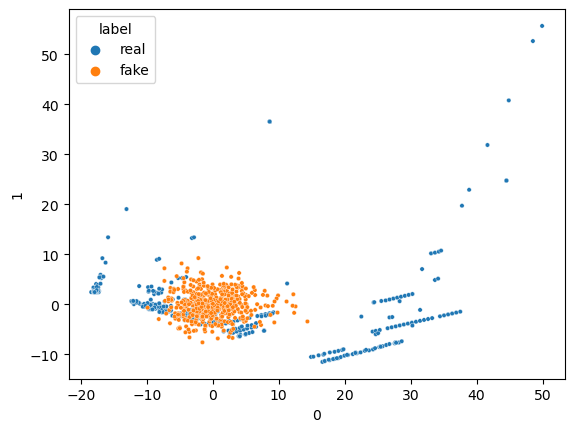

16/16 [==============================] - 0s 921us/step


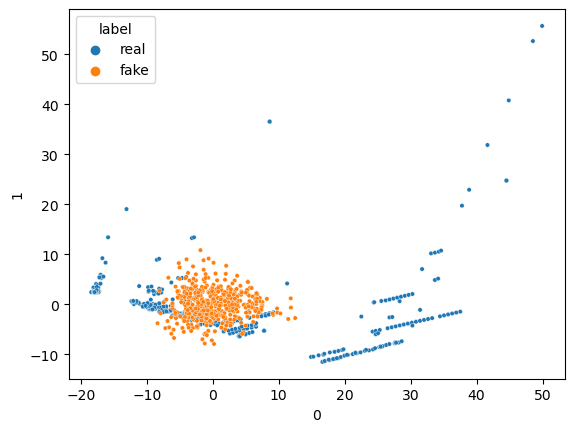

16/16 [==============================] - 0s 864us/step


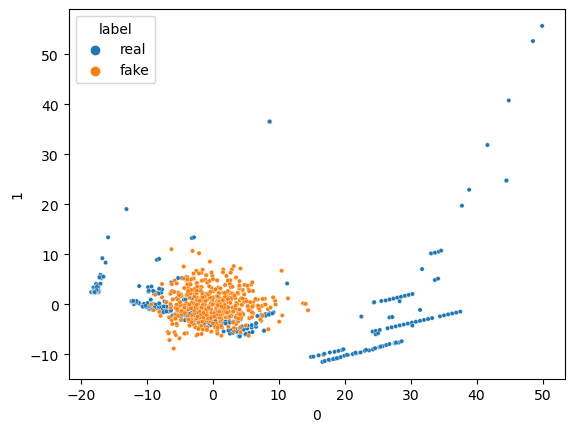

16/16 [==============================] - 0s 906us/step


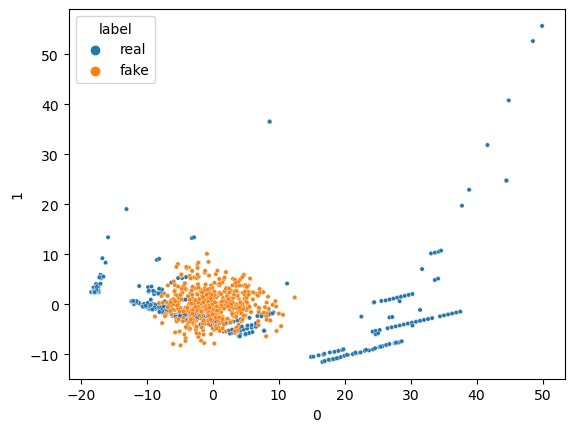

16/16 [==============================] - 0s 873us/step


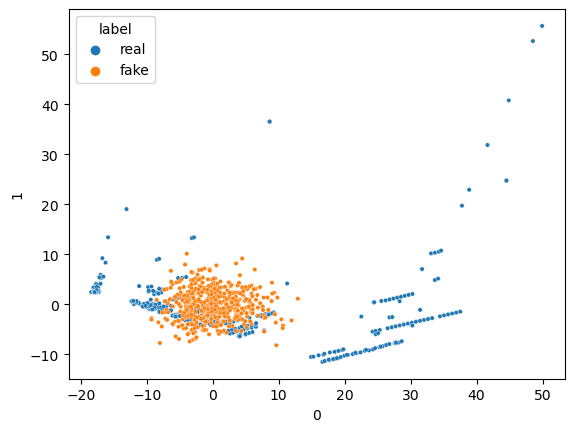

16/16 [==============================] - 0s 1ms/step


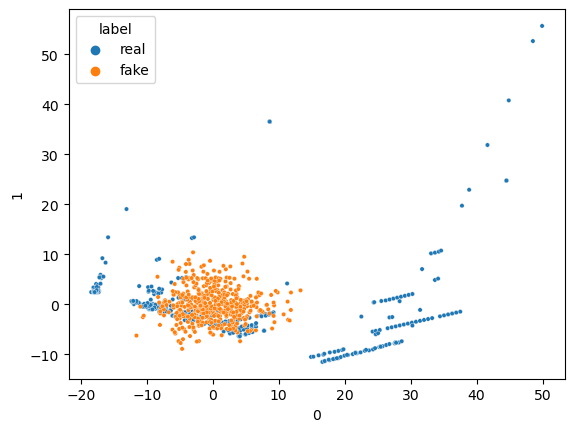

16/16 [==============================] - 0s 6ms/step


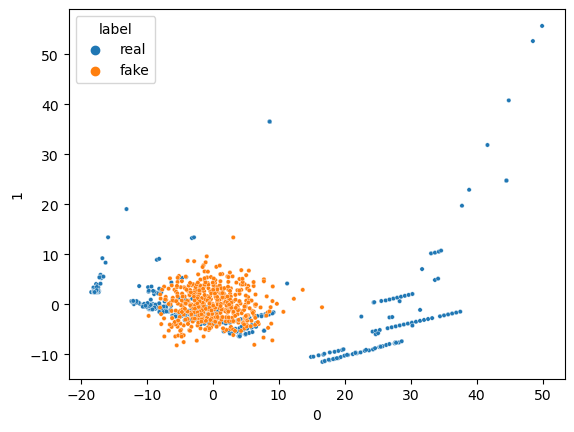

16/16 [==============================] - 0s 1ms/step


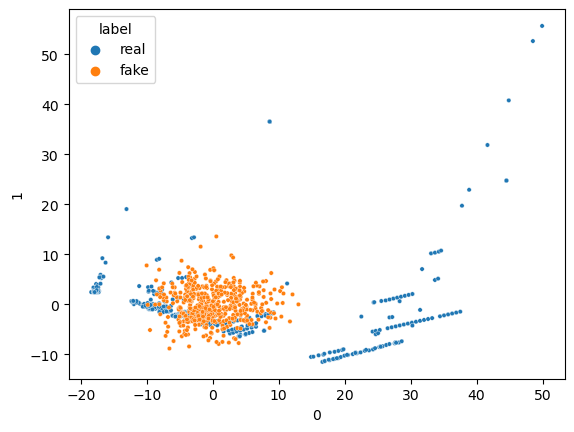

16/16 [==============================] - 0s 1ms/step


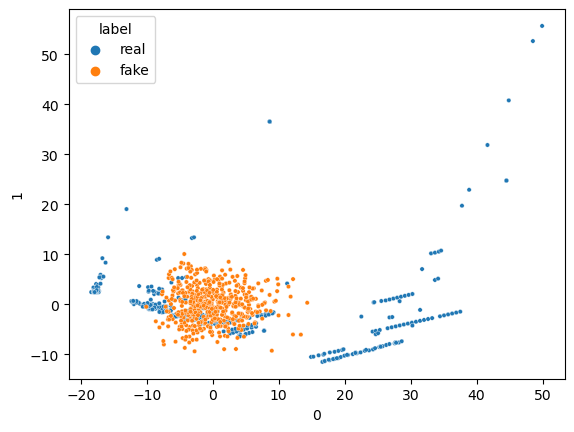

16/16 [==============================] - 0s 854us/step


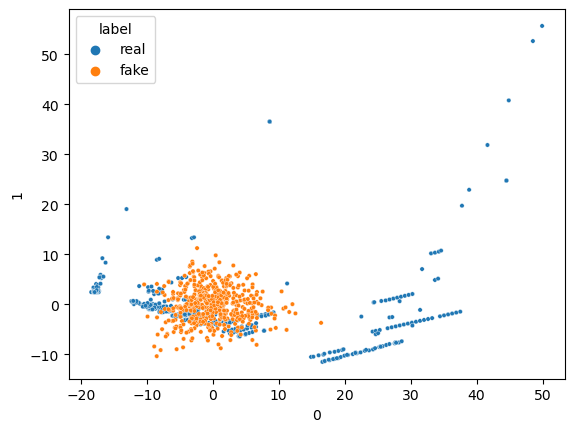

16/16 [==============================] - 0s 6ms/step


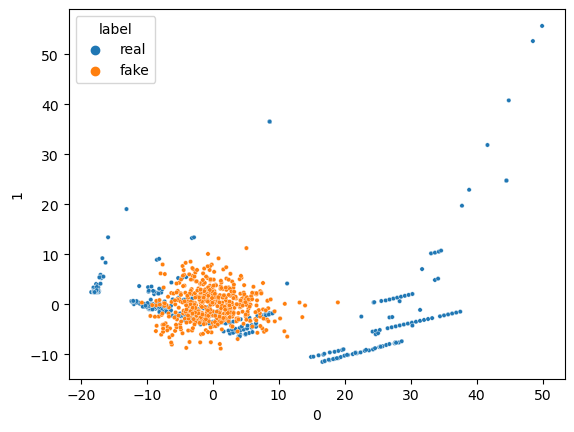

16/16 [==============================] - 0s 1ms/step


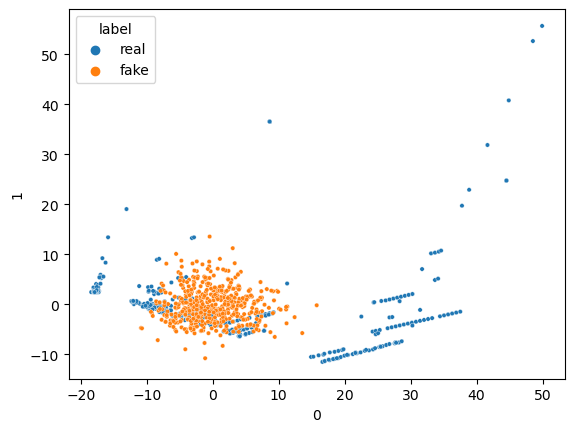

16/16 [==============================] - 0s 6ms/step


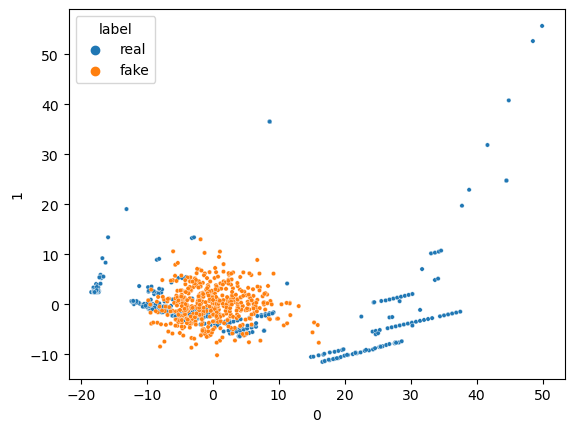

16/16 [==============================] - 0s 1ms/step


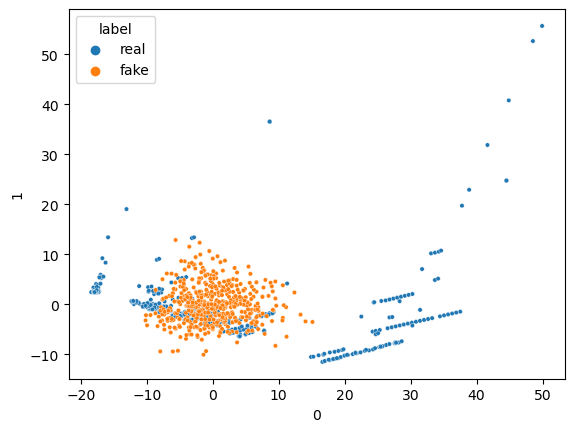

16/16 [==============================] - 0s 996us/step


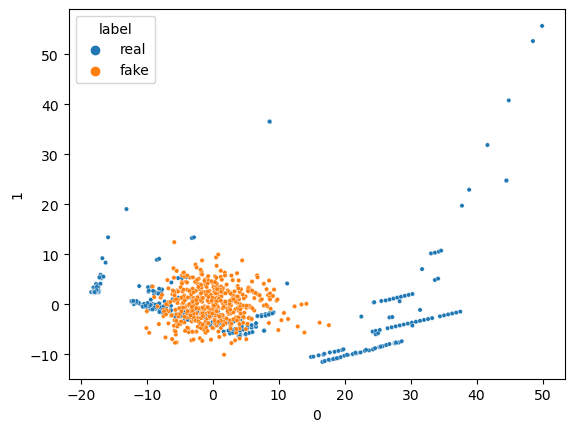

16/16 [==============================] - 0s 1ms/step


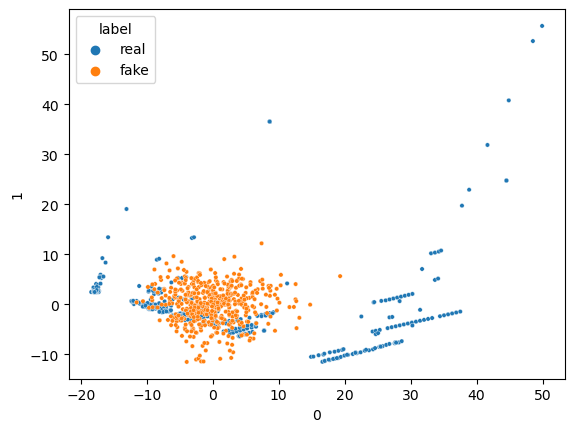

16/16 [==============================] - 0s 1ms/step


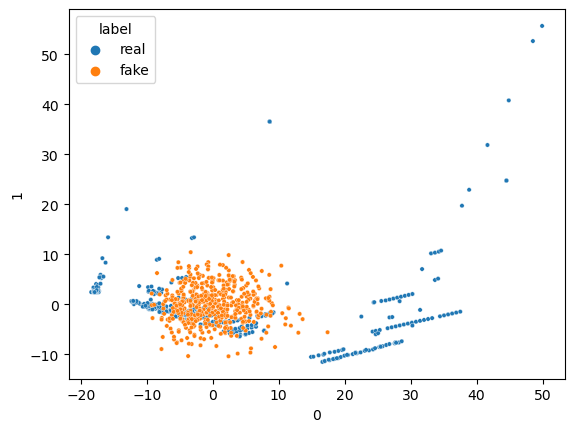

16/16 [==============================] - 0s 934us/step


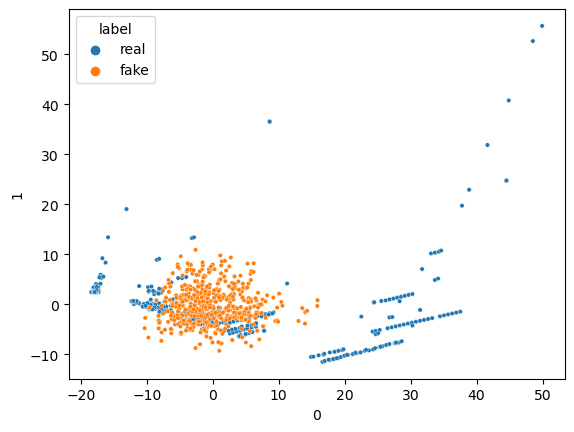

16/16 [==============================] - 0s 974us/step


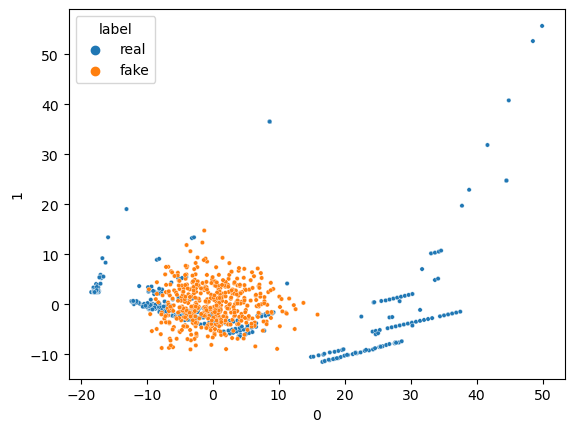

16/16 [==============================] - 0s 884us/step


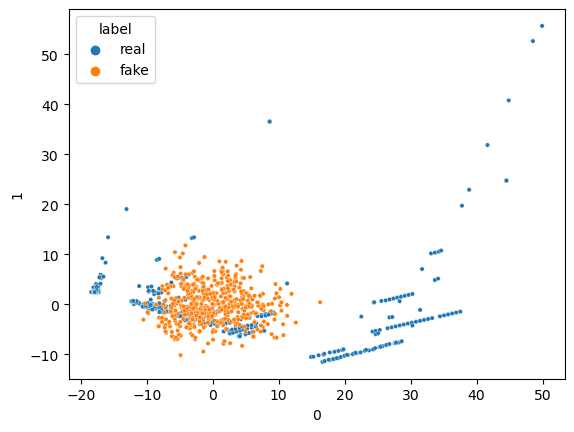

16/16 [==============================] - 0s 900us/step


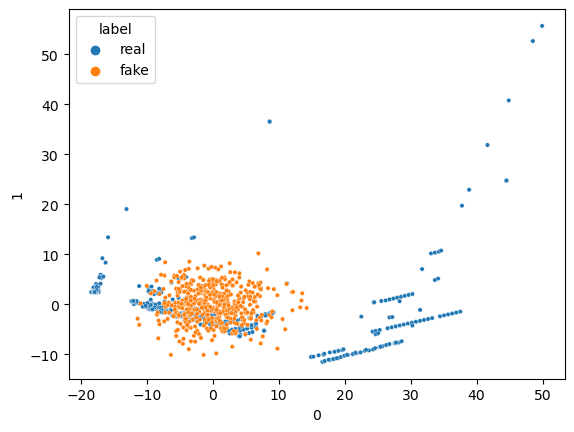

16/16 [==============================] - 0s 964us/step


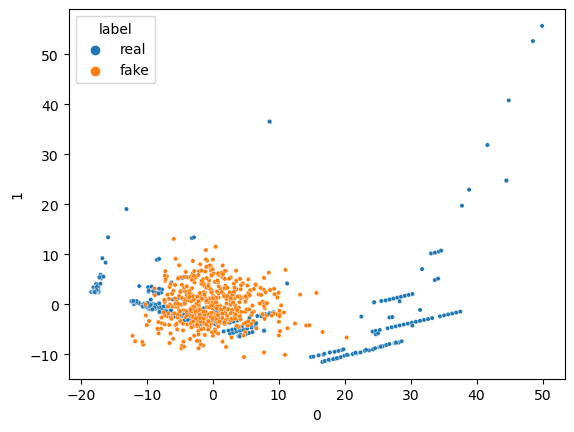

16/16 [==============================] - 0s 940us/step


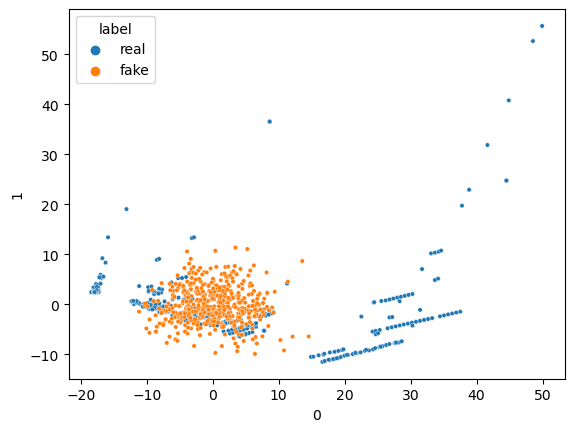

16/16 [==============================] - 0s 849us/step


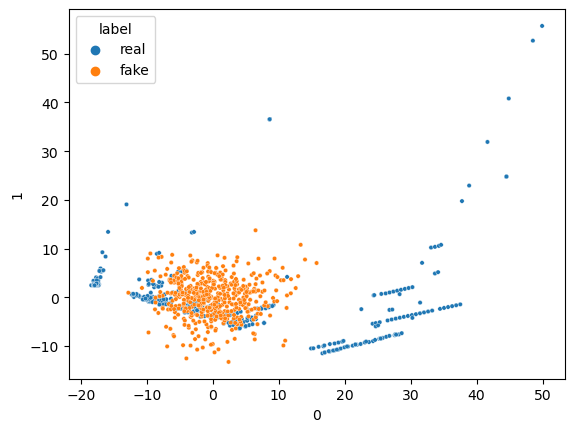

16/16 [==============================] - 0s 925us/step


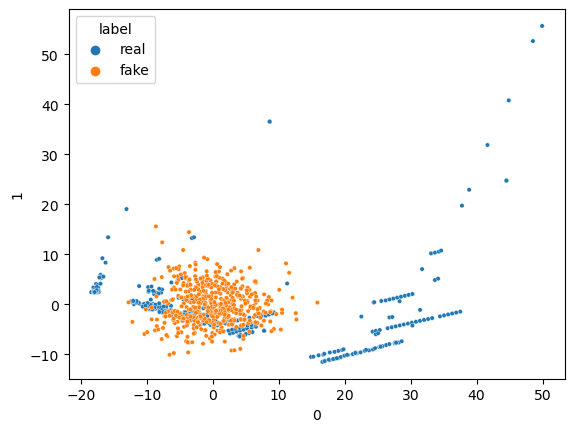

16/16 [==============================] - 0s 1ms/step


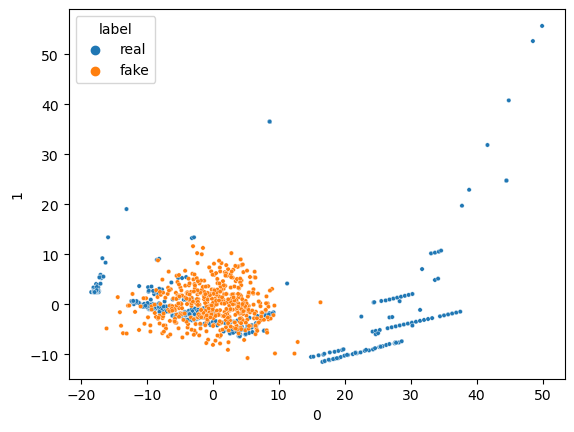

16/16 [==============================] - 0s 1ms/step


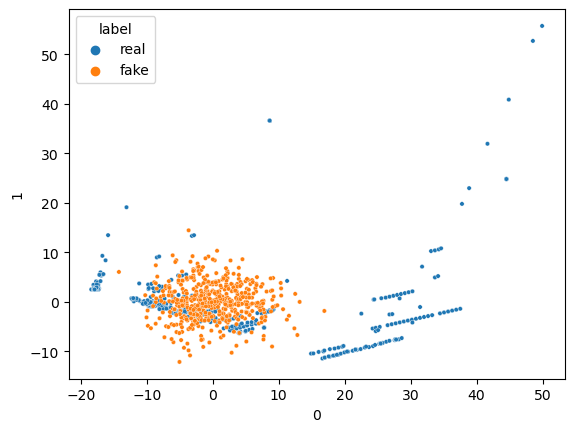

16/16 [==============================] - 0s 889us/step


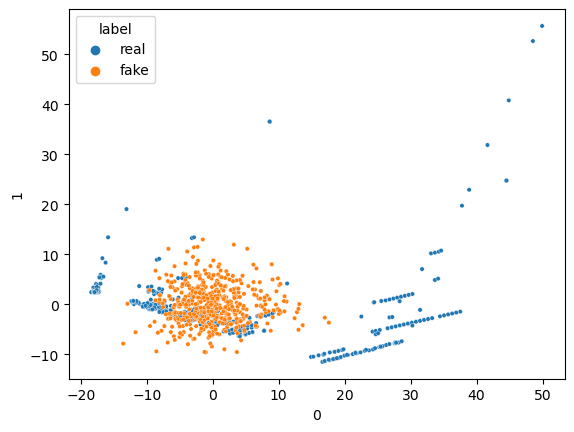

16/16 [==============================] - 0s 6ms/step


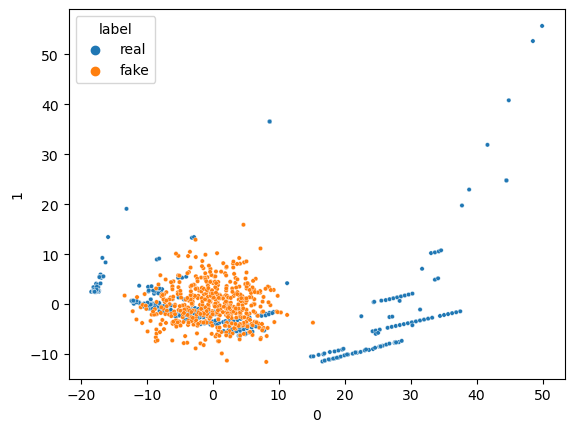

16/16 [==============================] - 0s 898us/step


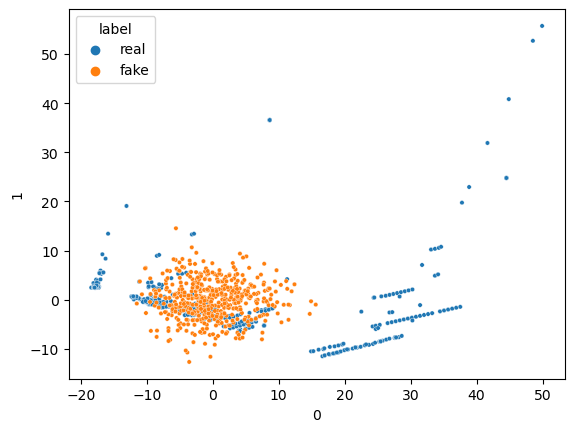

16/16 [==============================] - 0s 1ms/step


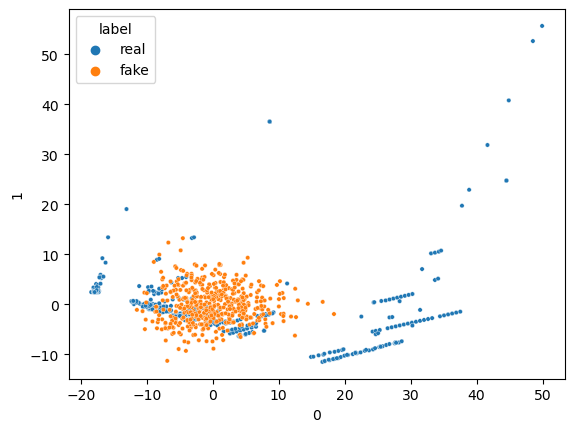

16/16 [==============================] - 0s 888us/step


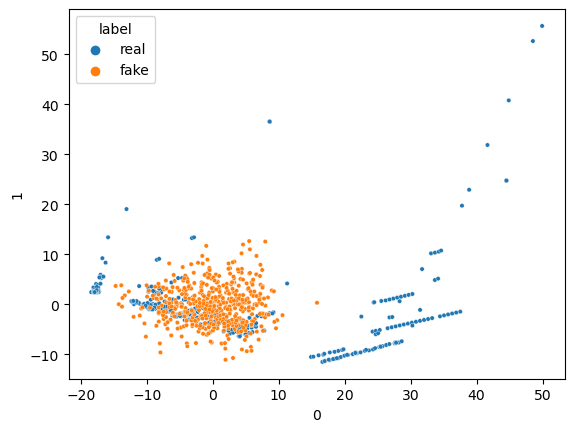

16/16 [==============================] - 0s 926us/step


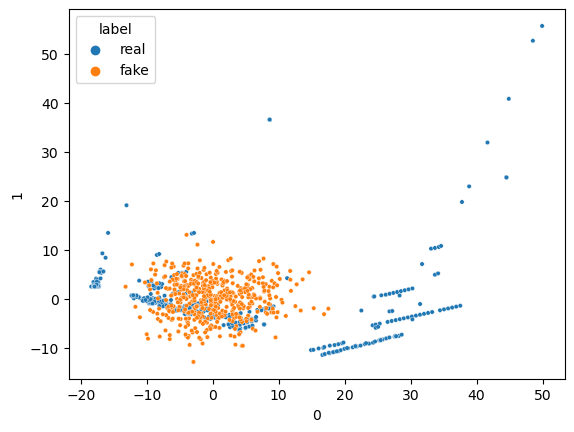

16/16 [==============================] - 0s 5ms/step


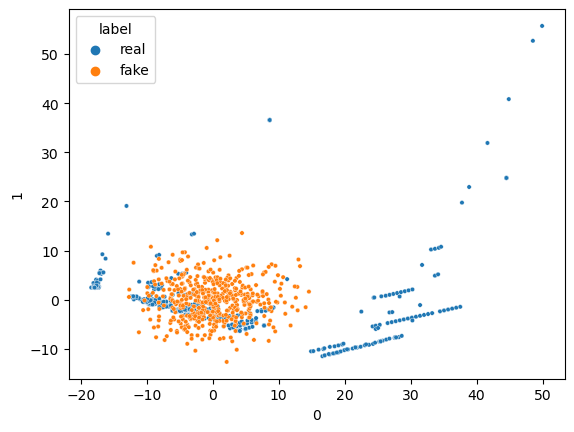

16/16 [==============================] - 0s 817us/step


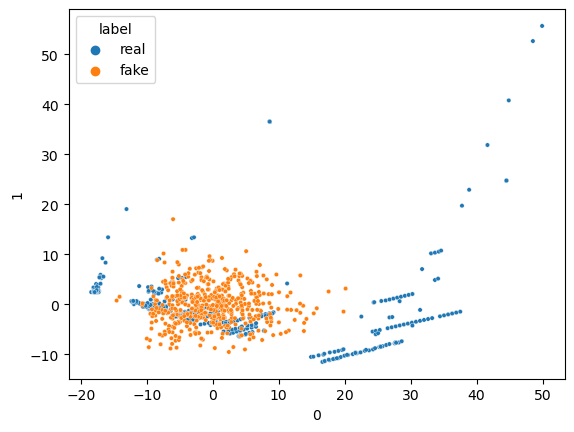

16/16 [==============================] - 0s 6ms/step


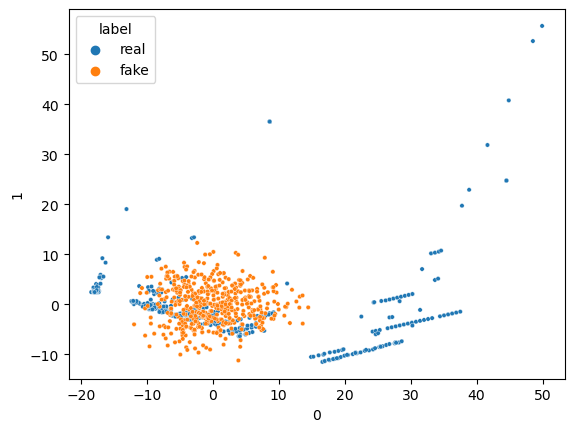

16/16 [==============================] - 0s 6ms/step


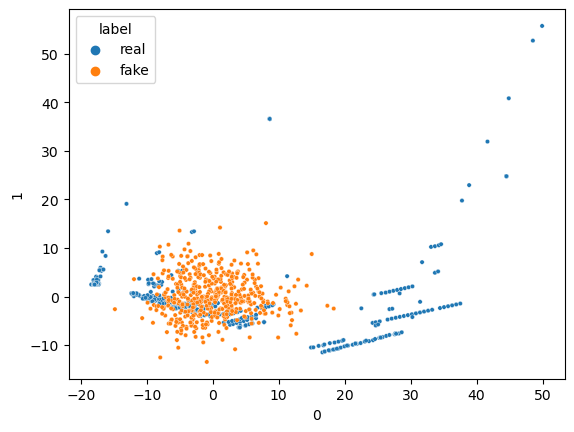

16/16 [==============================] - 0s 1ms/step


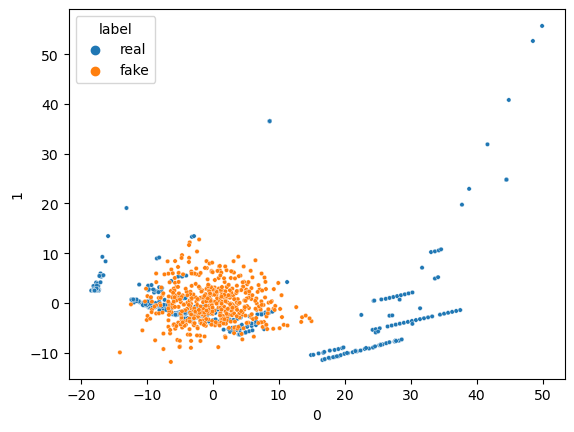

16/16 [==============================] - 0s 966us/step


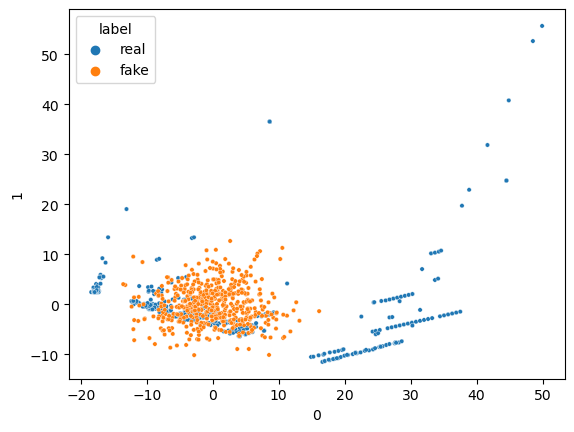

16/16 [==============================] - 0s 779us/step


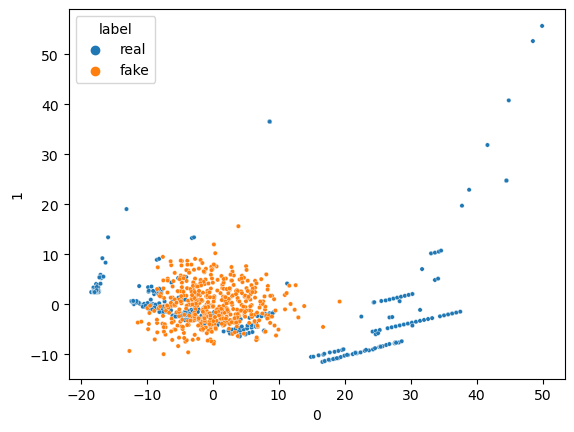

16/16 [==============================] - 0s 1ms/step


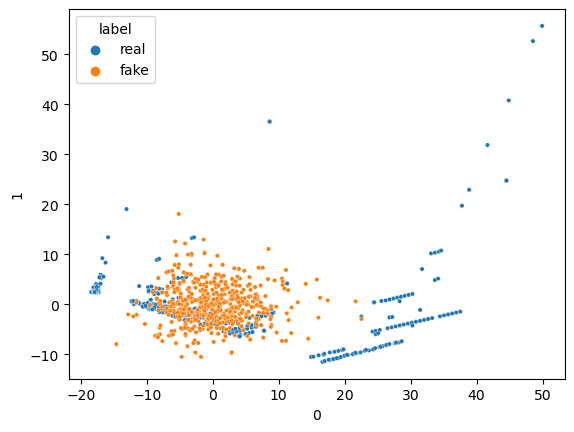

16/16 [==============================] - 0s 876us/step


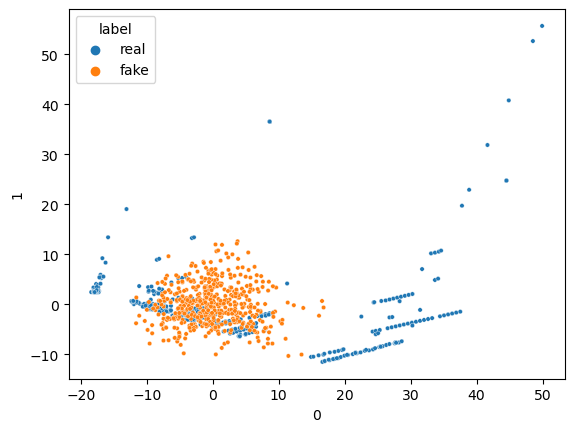

16/16 [==============================] - 0s 1ms/step


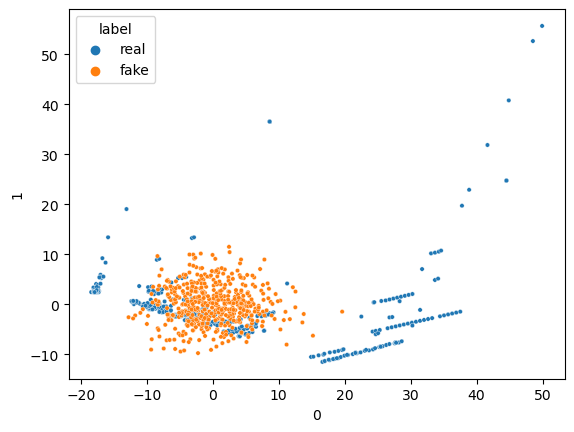

16/16 [==============================] - 0s 996us/step


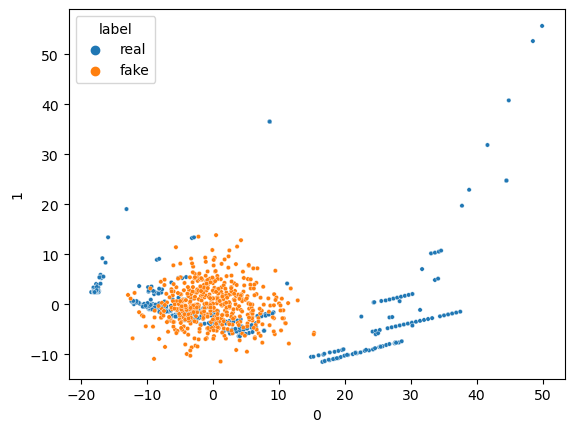

16/16 [==============================] - 0s 1ms/step


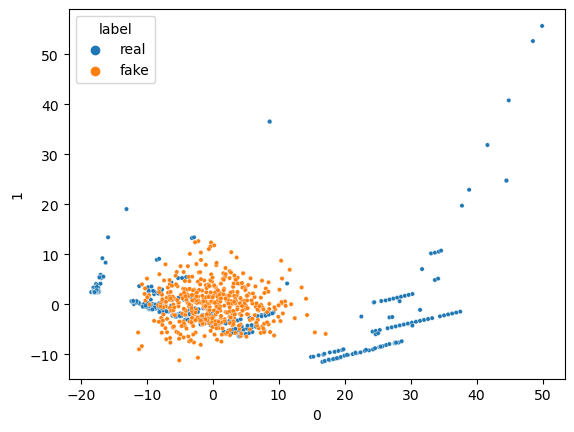

16/16 [==============================] - 0s 962us/step


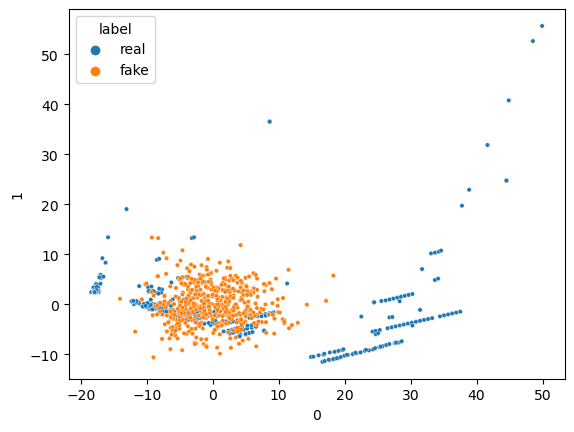

16/16 [==============================] - 0s 981us/step


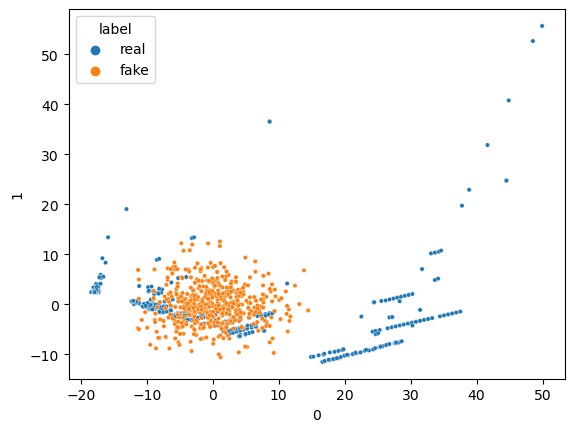

16/16 [==============================] - 0s 902us/step


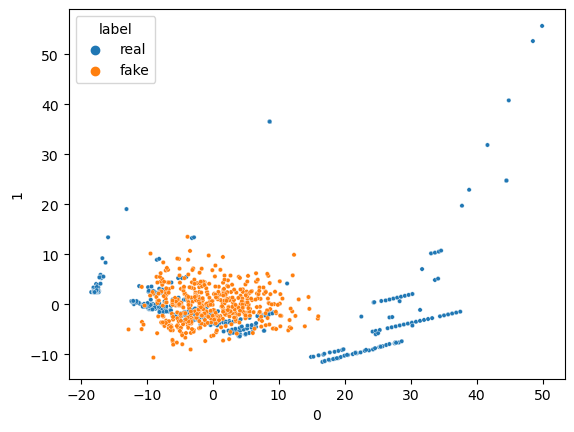

16/16 [==============================] - 0s 6ms/step


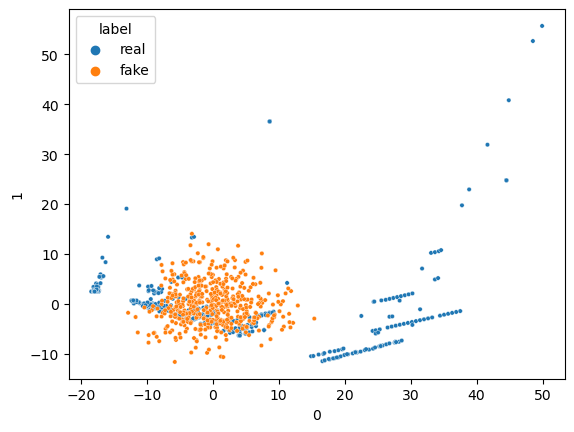

16/16 [==============================] - 0s 860us/step


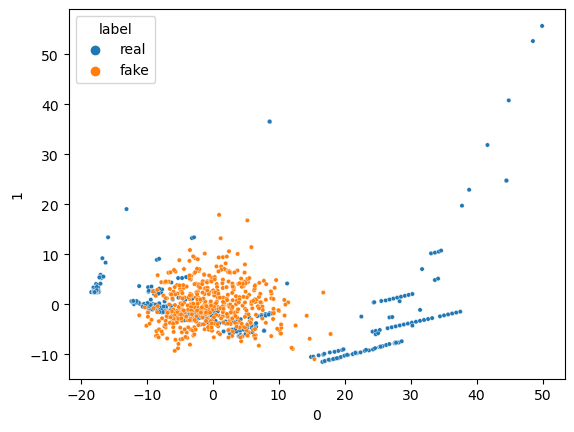

16/16 [==============================] - 0s 1ms/step


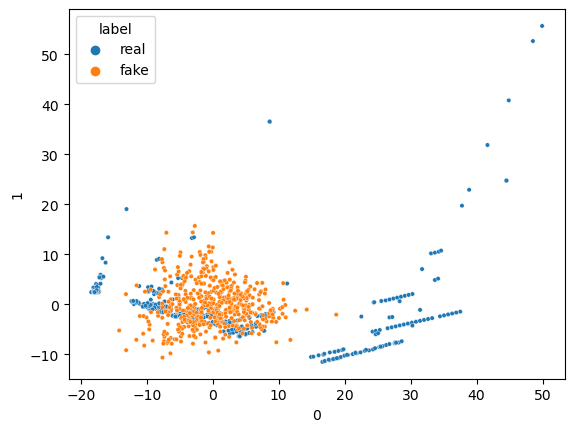

16/16 [==============================] - 0s 6ms/step


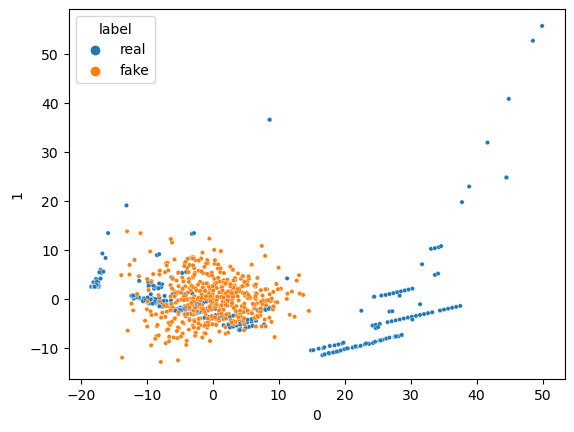

16/16 [==============================] - 0s 6ms/step


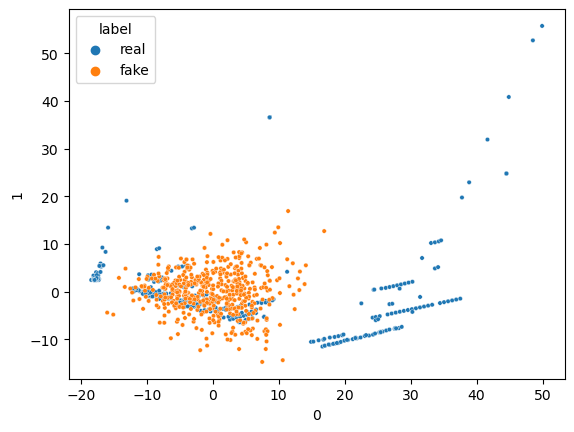

16/16 [==============================] - 0s 923us/step


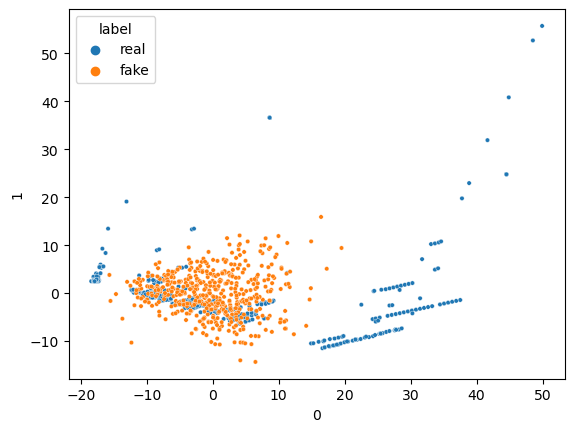

16/16 [==============================] - 0s 923us/step


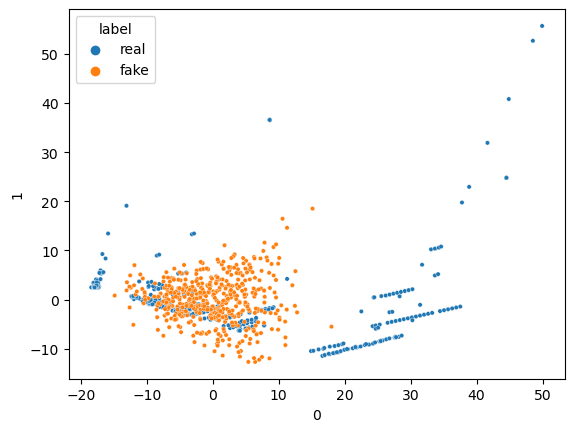

16/16 [==============================] - 0s 1ms/step


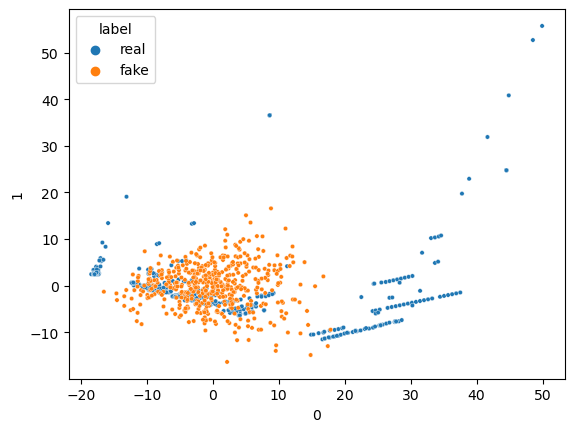

16/16 [==============================] - 0s 1ms/step


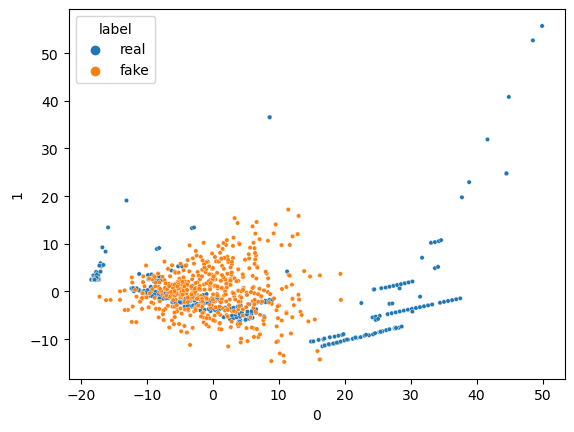

16/16 [==============================] - 0s 916us/step


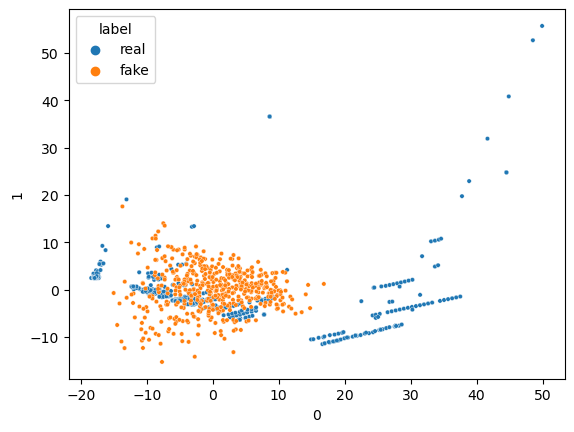

16/16 [==============================] - 0s 983us/step


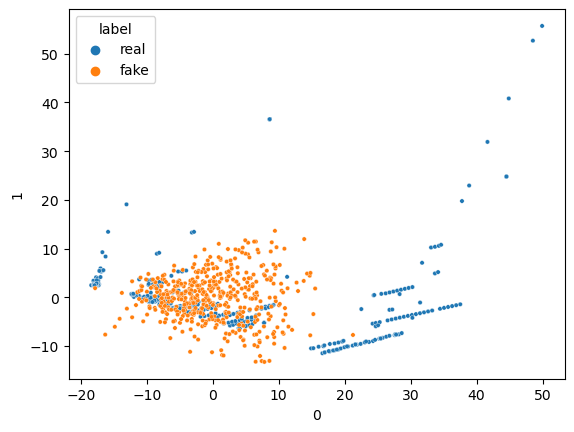

16/16 [==============================] - 0s 1ms/step


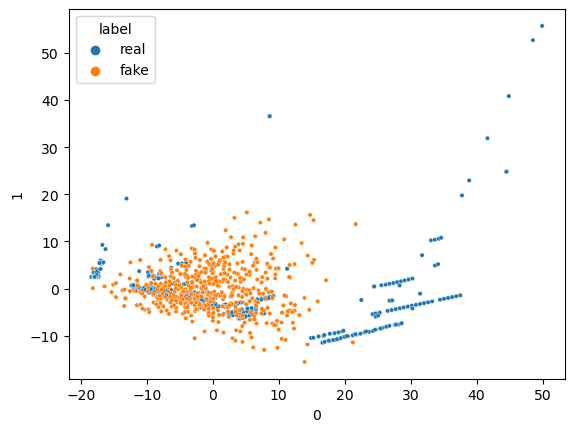

16/16 [==============================] - 0s 1ms/step


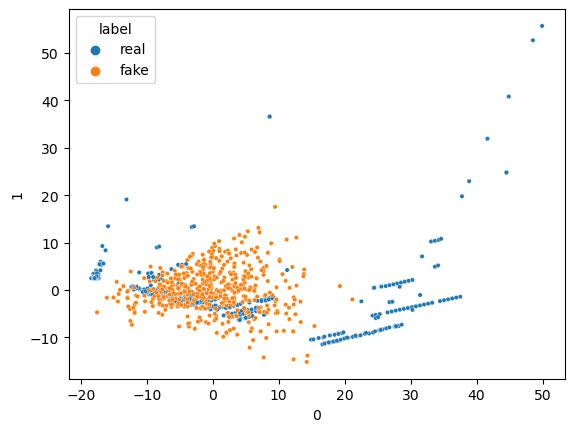

16/16 [==============================] - 0s 824us/step


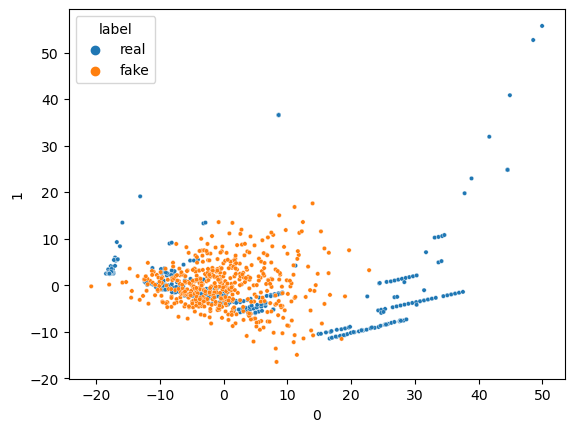

16/16 [==============================] - 0s 879us/step


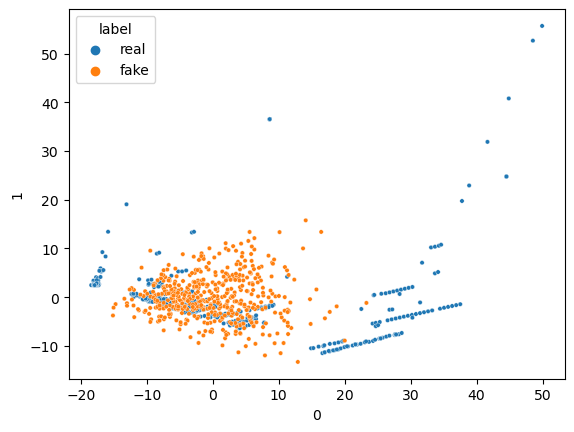

16/16 [==============================] - 0s 930us/step


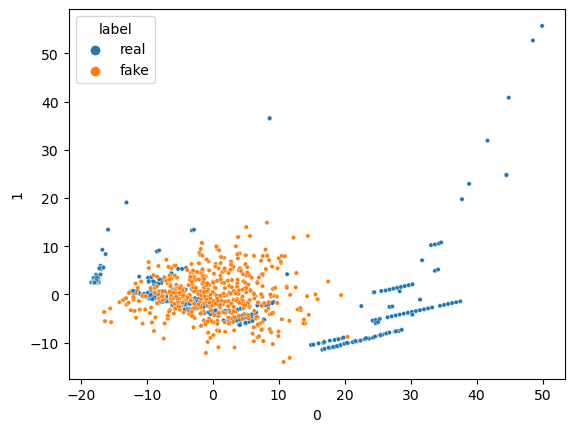

16/16 [==============================] - 0s 1ms/step


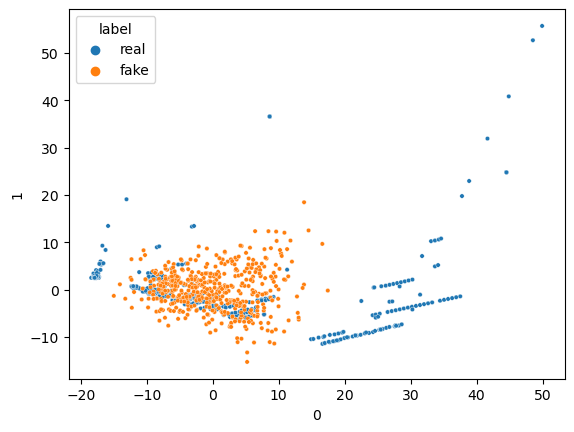

16/16 [==============================] - 0s 1ms/step


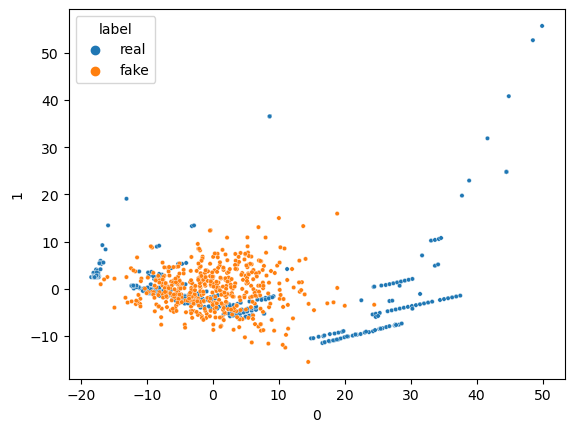

16/16 [==============================] - 0s 6ms/step


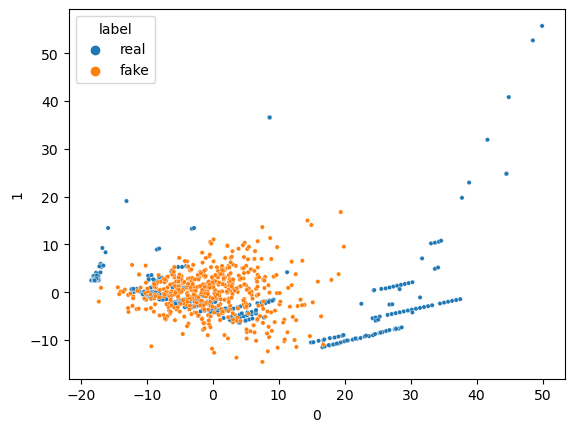

16/16 [==============================] - 0s 1ms/step


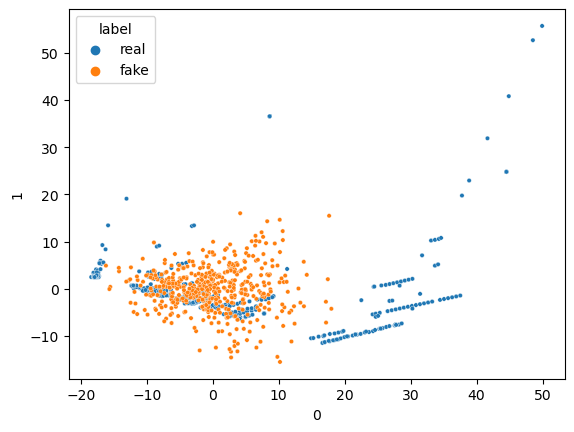

16/16 [==============================] - 0s 916us/step


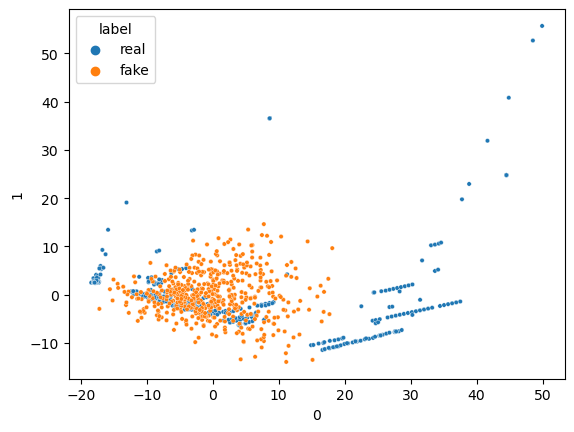

16/16 [==============================] - 0s 925us/step


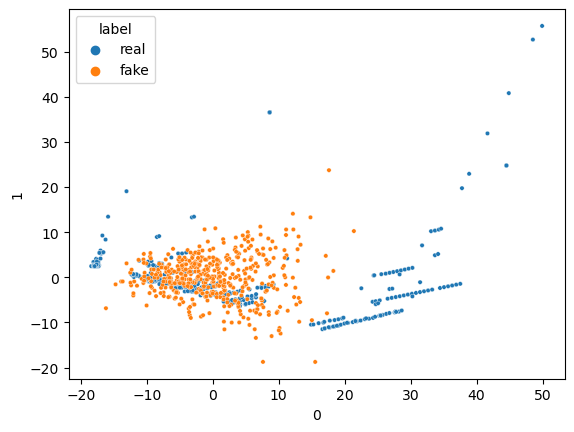

16/16 [==============================] - 0s 983us/step


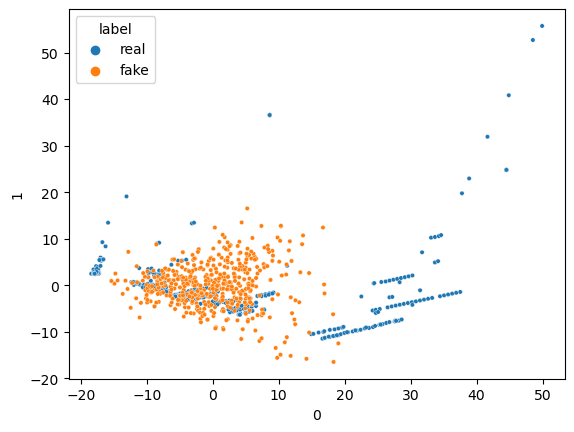

16/16 [==============================] - 0s 962us/step


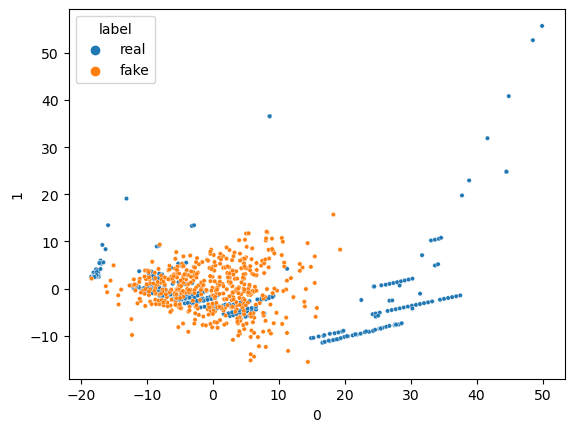

16/16 [==============================] - 0s 942us/step


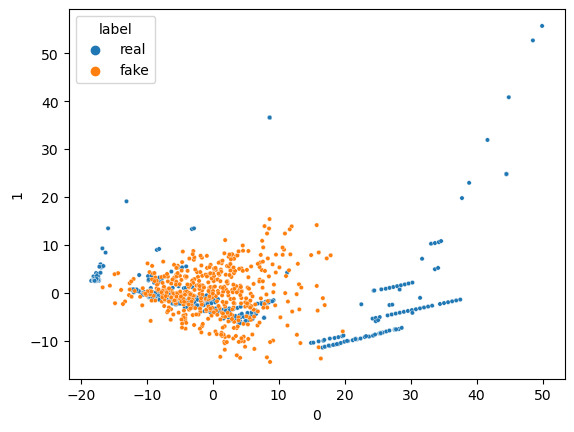

16/16 [==============================] - 0s 1ms/step


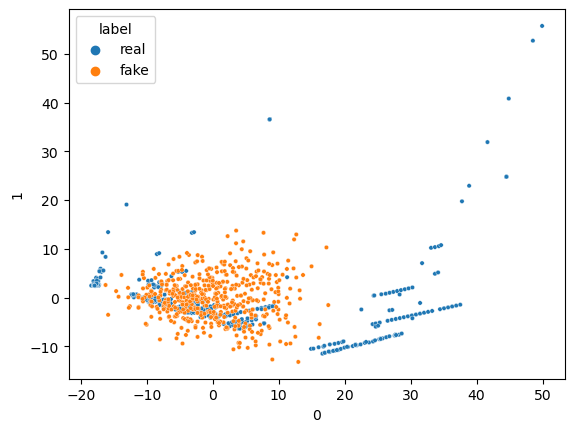

16/16 [==============================] - 0s 910us/step


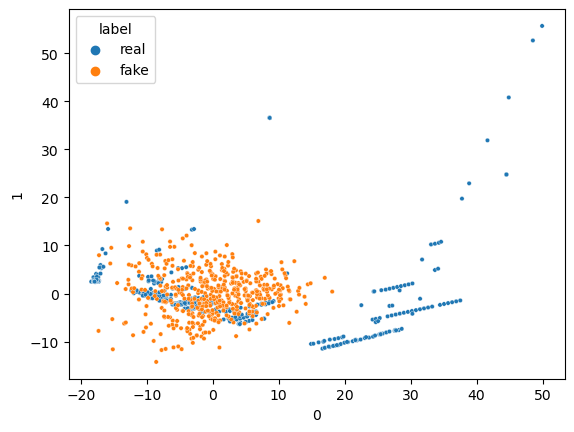

16/16 [==============================] - 0s 915us/step


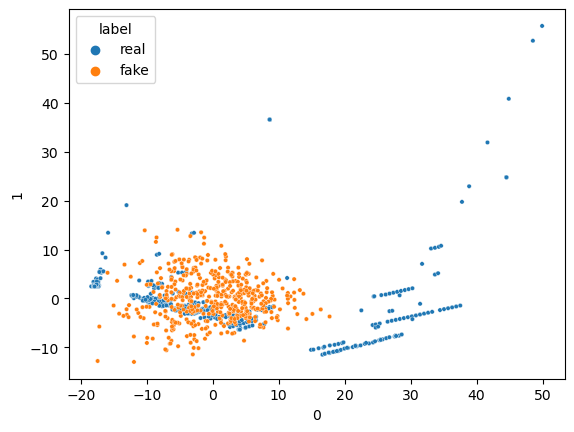

16/16 [==============================] - 0s 986us/step


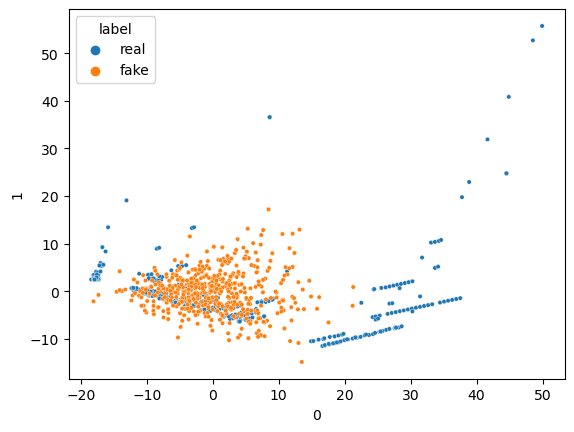

1/1 [==============================] - 0s 19ms/step


In [48]:
generator=build_generator()
discriminator=build_descriminator()
gan=build_gan(generator,discriminator)
gan.compile(optimizer='adam',loss="binary_crossentropy")

num_epoches = 1000
batch_size=64
half_batch=int(batch_size/2)

for epoch in range(num_epoches):
    
    X_fake=generate_synthetic_data(generator,half_batch)
    y_fake= np.zeros((half_batch,1))
    X_real=df_fraud.drop('Class',axis=1).sample(half_batch)
    y_real= np.ones((half_batch,1))
    
    discriminator.trainable=True
    discriminator.train_on_batch(X_real,y_real)
    discriminator.train_on_batch(X_fake,y_fake)
    
    noise=np.random.normal(0,1,(batch_size,29))
    gan.train_on_batch(noise,np.ones((batch_size,1)))
    
    if(epoch%10==0):
        monitor_generator(generator)

### Task 7 - Generate synthetic data using the trained Generator

*   Generate 1000 fradulent data points using the trained generator
*   Compare the distribution of `real` and `synthetic` fradulent data points.


In [49]:
df.shape

(50492, 3)

In [51]:
df2.shape

(492, 30)

In [52]:
synthetic_data=generate_synthetic_data(generator,1000)
df=pd.DataFrame(synthetic_data)
df['label']='fake'
df2=df_fraud.drop(columns=['Class'])
df2['label']='real'
df2.columns=df.columns
combined_df=pd.concat([df,df2])
combined_df.head()


32/32 [==============================] - 0s 796us/step


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,label
0,0.449362,-0.147414,-1.697887,-4.130511,-1.397790,0.978305,-1.827729,-0.662608,1.105929,1.536623,...,-2.250739,1.455405,-0.689386,2.836848,-2.533973,-5.327277,-2.407032,-0.255797,0.881851,fake
1,-1.788322,-0.441934,0.056383,1.744755,1.109926,-0.189373,0.582282,0.454771,-1.281216,-0.660686,...,1.252711,0.006506,-0.149115,-0.392957,0.124933,1.320534,1.165991,0.559451,0.398592,fake
2,0.201053,-0.620931,-0.957793,-3.411237,-2.586982,0.553481,-0.723122,-0.844940,1.742906,-0.072413,...,-1.454022,1.346105,-0.488963,2.961234,-2.794368,-4.464951,-2.942579,0.472052,1.398855,fake
3,2.469939,-0.065738,2.104466,2.203874,2.365866,-5.399055,-1.086112,-1.520548,0.991564,-1.425767,...,-0.278037,-2.282613,-1.015966,-0.514268,1.110250,1.846212,0.753739,2.067377,-1.881647,fake
4,0.855356,0.241938,0.489693,-0.929446,-0.607747,-0.730834,-0.548842,-1.313587,0.040376,1.794446,...,1.483324,-0.880172,-0.291745,-0.194176,-0.103544,0.735014,-0.585660,-0.585402,-0.734192,fake


In [53]:
combined_df

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,label
0,0.449362,-0.147414,-1.697887,-4.130511,-1.397790,0.978305,-1.827729,-0.662608,1.105929,1.536623,...,-2.250739,1.455405,-0.689386,2.836848,-2.533973,-5.327277,-2.407032,-0.255797,0.881851,fake
1,-1.788322,-0.441934,0.056383,1.744755,1.109926,-0.189373,0.582282,0.454771,-1.281216,-0.660686,...,1.252711,0.006506,-0.149115,-0.392957,0.124933,1.320534,1.165991,0.559451,0.398592,fake
2,0.201053,-0.620931,-0.957793,-3.411237,-2.586982,0.553481,-0.723122,-0.844940,1.742906,-0.072413,...,-1.454022,1.346105,-0.488963,2.961234,-2.794368,-4.464951,-2.942579,0.472052,1.398855,fake
3,2.469939,-0.065738,2.104466,2.203874,2.365866,-5.399055,-1.086112,-1.520548,0.991564,-1.425767,...,-0.278037,-2.282613,-1.015966,-0.514268,1.110250,1.846212,0.753739,2.067377,-1.881647,fake
4,0.855356,0.241938,0.489693,-0.929446,-0.607747,-0.730834,-0.548842,-1.313587,0.040376,1.794446,...,1.483324,-0.880172,-0.291745,-0.194176,-0.103544,0.735014,-0.585660,-0.585402,-0.734192,fake
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50487,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.277825,real
50488,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.369281,real
50489,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.042898,real
50490,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.664244,real


Checking the individual feature distribution of `synthetic` and `real` fraud data.

In [54]:
for col in combined_df.columns:
  plt.figure()
  fig = px.histogram(combined_df, color = 'label', x=col,barmode="overlay", title = f'Feature {col}', width = 640, height = 500)
  fig.show()

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>